In [1]:
import pandas as pd
import numpy as np

In [2]:
!pip install geopandas

     |████████████████████████████████| 962 kB 13.7 MB/s eta 0:00:01
     |████████████████████████████████| 14.8 MB 54.9 MB/s eta 0:00:01
     |████████████████████████████████| 6.4 MB 24.3 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 46.5 MB/s eta 0:00:01


In [3]:
import json
import geopandas as gpd
import matplotlib.pyplot as plt
import os
##URL del archivo csv de la página de datos abiertos del GOBCDMX
url = "https://datos.cdmx.gob.mx/dataset/04a1900a-0c2f-41ed-94dc-3d2d5bad4065/resource/03368e1e-f05e-4bea-ac17-58fc650f6fee/download/coloniascdmx.csv"

#Directorio de trabajo
dir = os.path.expanduser('~/Users/hecto')
#os.chdir("C:\\Users\\hecto")

#Importar archivo
test = pd.read_csv(url)

##Corroborar que no haya NAs
validos = test[~test["geo_shape"].isna()]

#Nombres de las variables contenidas en CSV
validos.iloc[0]


features = []
#Se itera sobre todas las filas para construir tanto el diccionario properties como el diccionario geometry
for colonia in validos.iterrows():
    ids = colonia[1]["id"]
    nombre = colonia[1]["nombre"]
    entidad = colonia[1]["entidad"]
    geopoint = str(colonia[1]["geo_point_2d"]).split(',')
    cve_alc = colonia[1]["cve_alc"]
    alcaldia = colonia[1]["alcaldia"]
    cve_col = colonia[1]["cve_col"]
    secc_com = str(colonia[1]["secc_com"]).split(',')
    secc_par = str(colonia[1]["secc_par"]).split(',')
    geometry = json.loads(colonia[1]["geo_shape"])
    properties = {
        "id": ids,
        "nombre": nombre,
        "entidad": entidad,
        "geopoint": geopoint,
        "cve_alc": cve_alc,
        "alcaldia": alcaldia,
        "cve_col": cve_col,
        "secc_com": secc_com,
        "secc_par": secc_par,
    }
    feat = {
        "type": "Feature",
        "properties": properties,
        "geometry": geometry
    }
    features.append(feat)

diccio = {"type": "FeatureCollection", "name": "Colonias_CDMX", "features": features}

#Guardar archivo GeoJSON
with open("colonias.json", "w") as outfile:
    json.dump(diccio, outfile)

In [4]:
CDMX_geo=r'colonias.json'

In [5]:
url = "https://datos.cdmx.gob.mx/dataset/04a1900a-0c2f-41ed-94dc-3d2d5bad4065/resource/03368e1e-f05e-4bea-ac17-58fc650f6fee/download/coloniascdmx.csv"
df_loc = pd.read_csv(url)
df_loc[['Latitude','Longitude']] = df_loc.geo_point_2d.str.split(",",expand=True,)
df_loc.drop(['id','entidad','geo_point_2d','geo_shape','cve_alc','cve_col','secc_com','secc_par'], axis=1, inplace=True)
df_loc = df_loc.rename(columns={'nombre':'Neighborhood','alcaldia':'Borough'})
df_loc

,Neighborhood,Borough,Latitude,Longitude
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513
3,PEDREGAL DE SANTA URSULA I,COYOACAN,19.314862237,-99.1477954505
4,AJUSCO I,COYOACAN,19.324571116,-99.1561602234
...,...,...,...,...
1807,LA VIRGEN 1170 (U HAB),COYOACAN,19.3235620501,-99.1041300516
1808,AVIACION CIVIL,VENUSTIANO CARRANZA,19.4151260367,-99.0796617119
1809,TAXQUEA,COYOACAN,19.3392324,-99.1232106865
1810,EX EJIDO SAN FRANCISCO CULHUACAN III,COYOACAN,19.3307417643,-99.1221305228


In [6]:
missing_data = df_loc.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")

Neighborhood
False    1812
Name: Neighborhood, dtype: int64

Borough
False    1812
Name: Borough, dtype: int64

Latitude
False    1808
True        4
Name: Latitude, dtype: int64

Longitude
False    1808
True        4
Name: Longitude, dtype: int64



In [7]:
nan_rows1 = df_loc[df_loc.isnull().any(1)]
nan_rows1

,Neighborhood,Borough,Latitude,Longitude
420,MAZA,CUAUHTEMOC,NaN,NaN
885,SAN PABLO OZTOTEPEC (PBLO),MILPA ALTA,NaN,NaN
1002,LOS CERRILLOS I,XOCHIMILCO,NaN,NaN
1021,CHIMALCOYOC,TLALPAN,NaN,NaN


In [8]:
df_loc.dropna(subset=["Latitude"], axis=0, inplace=True)
df_loc.dropna(subset=["Longitude"], axis=0, inplace=True)
df_loc.reset_index(drop=True, inplace=True)
df_CDMX=df_loc.copy()
df_loc

,Neighborhood,Borough,Latitude,Longitude
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513
3,PEDREGAL DE SANTA URSULA I,COYOACAN,19.314862237,-99.1477954505
4,AJUSCO I,COYOACAN,19.324571116,-99.1561602234
...,...,...,...,...
1803,LA VIRGEN 1170 (U HAB),COYOACAN,19.3235620501,-99.1041300516
1804,AVIACION CIVIL,VENUSTIANO CARRANZA,19.4151260367,-99.0796617119
1805,TAXQUEA,COYOACAN,19.3392324,-99.1232106865
1806,EX EJIDO SAN FRANCISCO CULHUACAN III,COYOACAN,19.3307417643,-99.1221305228


In [9]:
# The code was removed by Watson Studio for sharing.

In [10]:
import json # library to handle JSON files


!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install folium
import folium # map rendering library

print('Libraries imported.')

     |████████████████████████████████| 94 kB 6.8 MB/s  eta 0:00:01
Libraries imported.


In [11]:
geolocator = Nominatim(user_agent="My_CDMX")
#Localating Mexico City
location = 'Mexico City, CDMX'
adress = 'Mexico City, CDMX'
loc_cdmx = geolocator.geocode(location)
lat_cdmx = loc_cdmx.latitude
lon_cdmx = loc_cdmx.longitude
print('The geograpical coordinate of Mexico City are {}, {}.'.format(lat_cdmx, lon_cdmx))

The geograpical coordinate of Mexico City are 19.4326296, -99.1331785.


In [62]:
def getNearbyVenues(names, latitudes, longitudes, radius=600, search_query = 'Taco Place' ):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url ='https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&query={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            search_query,
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [13]:
df_afueras=df_loc.loc[(df_loc['Borough'] == 'GUSTAVO A. MADERO') | (df_loc['Borough']== 'ALVARO OBREGON')|(df_loc['Borough']== 'CUAJIMALPA DE MORELOS')
                      |(df_loc['Borough']== 'IZTACALCO')|(df_loc['Borough']== 'LA MAGDALENA CONTRERAS')|(df_loc['Borough']== 'IZTAPALAPA')]

In [14]:
df_centro=df_loc.loc[(df_loc['Borough'] == 'CUAUHTEMOC') | (df_loc['Borough']== 'BENITO JUAREZ') | (df_loc['Borough']== 'MIGUEL HIDALGO') 
                   | (df_loc['Borough']== 'COYOACAN')|(df_loc['Borough']== 'VENUSTIANO CARRANZA')|(df_loc['Borough']== 'AZCAPOTZALCO')]

In [15]:
df_faltantes=df_loc.loc[(df_loc['Borough']== 'XOCHIMILCO') | (df_loc['Borough']== 'TLALPAN') 
                        |(df_loc['Borough']== 'TLAHUAC')|(df_loc['Borough']== 'MILPA ALTA')]

In [18]:
CDMX_venuesA = getNearbyVenues(names=df_afueras['Neighborhood'],
                                   latitudes=df_afueras['Latitude'],
                                   longitudes=df_afueras['Longitude'])

In [19]:
CDMX_venuesB = getNearbyVenues(names=df_centro['Neighborhood'],
                                   latitudes=df_centro['Latitude'],
                                   longitudes=df_centro['Longitude'])

In [20]:
CDMX_venuesC = getNearbyVenues(names=df_faltantes['Neighborhood'],
                                   latitudes=df_faltantes['Latitude'],
                                   longitudes=df_faltantes['Longitude'])

In [36]:
print(CDMX_venuesA.shape)
CDMX_venuesA2=CDMX_venuesA.copy()
CDMX_venuesA

(27959, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,CTM EL RISCO (U HAB),19.5094365342,-99.0960012649,Barbacoa Don Javier,19.513011,-99.088075,Taco Place
1,CTM EL RISCO (U HAB),19.5094365342,-99.0960012649,Taquería Félix,19.514260,-99.086353,Taco Place
2,CTM EL RISCO (U HAB),19.5094365342,-99.0960012649,Tacos El Paisa,19.508723,-99.083426,Taco Place
3,CTM EL RISCO (U HAB),19.5094365342,-99.0960012649,"Carnitas ""Los portales""",19.518286,-99.090247,Taco Place
4,CTM EL RISCO (U HAB),19.5094365342,-99.0960012649,Tacos de Alma,19.507942,-99.097543,Taco Place
...,...,...,...,...,...,...,...
27954,BENITO JUAREZ,19.3296058799,-99.0785966228,Las Qkas De Doña Manuela,19.316960,-99.080585,Taco Place
27955,BENITO JUAREZ,19.3296058799,-99.0785966228,"Tacos ""Doña julia""",19.340885,-99.071839,Taco Place
27956,BENITO JUAREZ,19.3296058799,-99.0785966228,Tacos Don Memo,19.333959,-99.065644,Taco Place
27957,BENITO JUAREZ,19.3296058799,-99.0785966228,"Tortas y Flautas ""El Gato""",19.328599,-99.064826,Taco Place


In [22]:
print(CDMX_venuesB.shape)
CDMX_venuesB2=CDMX_venuesB.copy()
CDMX_venuesB.head()

(32330, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,El Turix,19.428038,-99.210940,Taco Place
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,La Onda,19.427765,-99.211429,Taco Place
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Tacos de La Covadonga,19.428801,-99.211297,Taco Place
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,El Califa,19.429966,-99.211839,Taco Place
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Tacos De Cabeza Lomas,19.422033,-99.207478,Taco Place


In [40]:
print(CDMX_venuesC.shape)
CDMX_venuesC2=CDMX_venuesC.copy
CDMX_venuesC.head()

(7728, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"MESA LOS HORNOS, TEXCALTENCO",19.2748311669,-99.1844408992,Tacos Rey,19.273547,-99.188574,Taco Place
1,"MESA LOS HORNOS, TEXCALTENCO",19.2748311669,-99.1844408992,Copacabanito,19.280443,-99.184299,Taco Place
2,"MESA LOS HORNOS, TEXCALTENCO",19.2748311669,-99.1844408992,Carnitas Don Toño,19.280520,-99.184544,Taco Place
3,"MESA LOS HORNOS, TEXCALTENCO",19.2748311669,-99.1844408992,"Tacos ""El Güero""",19.275039,-99.175817,Taco Place
4,"MESA LOS HORNOS, TEXCALTENCO",19.2748311669,-99.1844408992,Tacos Don Pepe,19.282082,-99.174077,Taco Place


In [24]:
CDMX_tacosA=CDMX_venuesA.groupby(['Neighborhood'],as_index=False).count()
CDMX_tacosA.drop(['Neighborhood Latitude','Neighborhood Longitude','Venue','Venue Latitude','Venue Longitude'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
CDMX_tacosA.rename(columns={'Venue Category':'Count'}, inplace=True)
CDMX_tacosA=CDMX_tacosA.sort_values('Count', ascending=False)
CDMX_tacosA.reset_index(drop=True, inplace=True)
CDMX_tacosA

,Neighborhood,Count
0,EL RODEO,124
1,LA JOYA,112
2,LA CRUZ,106
3,FRANCISCO VILLA,97
4,INFONAVIT (U HAB),83
...,...,...
902,CAZULCO (BARR),1
903,COLA DE PATO,1
904,LA CARBONERA,1
905,MALACATES (AMPL),1


In [25]:
CDMX_tacosB=CDMX_venuesB.groupby(['Neighborhood'],as_index=False).count()
CDMX_tacosB.drop(['Neighborhood Latitude','Neighborhood Longitude','Venue','Venue Latitude','Venue Longitude'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
CDMX_tacosB.rename(columns={'Venue Category':'Count'}, inplace=True)
CDMX_tacosB=CDMX_tacosB.sort_values('Count', ascending=False)
CDMX_tacosB.reset_index(drop=True, inplace=True)
CDMX_tacosB

,Neighborhood,Count
0,EMILIANO ZAPATA (U HAB),117
1,CENTRO II,114
2,VALLE GOMEZ,113
3,ANGEL ZIMBRON,112
4,CENTRO I,101
...,...,...
546,LOMAS DE BARRILACO (LOMAS DE CHAPULTEPEC),11
547,LOMAS ALTAS,7
548,LOMAS DE REFORMA,5
549,BOSQUES DE LAS LOMAS,4


In [26]:
CDMX_tacosC=CDMX_venuesC.groupby(['Neighborhood'],as_index=False).count()
CDMX_tacosC.drop(['Neighborhood Latitude','Neighborhood Longitude','Venue','Venue Latitude','Venue Longitude'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
CDMX_tacosC.rename(columns={'Venue Category':'Count'}, inplace=True)
CDMX_tacosC=CDMX_tacosC.sort_values('Count', ascending=False)
CDMX_tacosC.reset_index(drop=True, inplace=True)
CDMX_tacosC

,Neighborhood,Count
0,SAN BARTOLO EL CHICO,153
1,NARCISO MENDOZA VILLA COAPA SUPERMANZANA 8 (U ...,85
2,BOSQUE RESIDENCIAL DEL SUR (FRACC),81
3,NUEVA ORIENTAL COAPA-EX HACIENDA COAPA,80
4,NARCISO MENDOZA-VILLA COAPA SUPER MANZANA 2 (U...,80
...,...,...
311,JARDINES DE SAN JUAN,1
312,SAN JOSE,1
313,EMILIANO ZAPATA 2A,1
314,EMILIANO ZAPATA 1A,1


In [31]:
CDMX_tacosR = pd.concat([CDMX_tacosA,CDMX_tacosB])
CDMX_tacosR=CDMX_tacosR.drop_duplicates(subset=['Neighborhood'], keep='last')
CDMX_tacosR2 = pd.concat([CDMX_tacosC,CDMX_tacosR])
CDMX_tacosR2=CDMX_tacosR2.drop_duplicates(subset=['Neighborhood'], keep='last')
CDMX_tacosR2.reset_index(drop=True, inplace=True)
CDMX_tacosR2=CDMX_tacosR2.sort_values('Count', ascending=False)
CDMX_tacosR2.loc[CDMX_tacosR2['Count'] > 120, 'Count'] = 120
CDMX_tacosR2.reset_index(drop=True, inplace=True)
CDMX_tacosR2

,Neighborhood,Count
0,SAN BARTOLO EL CHICO,120
1,EL RODEO,120
2,EMILIANO ZAPATA (U HAB),117
3,CENTRO II,114
4,VALLE GOMEZ,113
...,...,...
1725,JAIME TORRES BODET,1
1726,SAN LORENZO TLACOYUCAN (PBLO),1
1727,SAN MIGUEL (AMPL),1
1728,ATOCPA SUR,1


In [285]:
CDMX_tacosR2.head(20)

,Neighborhood,Count
0,SAN BARTOLO EL CHICO,120
1,EL RODEO,120
2,EMILIANO ZAPATA (U HAB),117
3,CENTRO II,114
4,VALLE GOMEZ,113
5,ANGEL ZIMBRON,112
6,LA JOYA,112
7,LA CRUZ,106
8,CENTRO I,101
9,MIGUEL ALEMAN,100


In [32]:
threshold_scale = np.linspace(CDMX_tacosR2['Count'].min(),
                              CDMX_tacosR2['Count'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
map_tacosAB2= folium.Map(location=[19.42847,-99.12766], zoom_start=11)
map_tacosAB2.choropleth(
    geo_data=CDMX_geo,
    data=CDMX_tacosR2,
    columns=['Neighborhood', 'Count'],
    key_on='feature.properties.nombre',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.9, 
    line_opacity=0.2,
    legend_name='Taco places density in Mexico City neighborhoods',
    reset=True
)
map_tacosAB2

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/folium/folium.py:413: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [63]:
CDMX_venuesT = getNearbyVenues(names=df_CDMX['Neighborhood'],
                                   latitudes=df_CDMX['Latitude'],
                                   longitudes=df_CDMX['Longitude'])

In [65]:
print(CDMX_venuesT.shape)
CDMX_venuesT2=CDMX_venuesT.copy()
CDMX_venuesT

(15277, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Mc Taco Carnitas y Barbacoa,19.419044,-99.215210,Taco Place
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Tacos De Cabeza,19.419003,-99.215088,Taco Place
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Los De Cabeza,19.418980,-99.215120,Taco Place
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,La Terraza De La Abuela,19.418834,-99.215286,Taco Place
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Tacos De Guisado,19.418130,-99.215632,Taco Place
...,...,...,...,...,...,...,...
15272,JARDIN BALBUENA I,19.4215844077,-99.1053538347,Quesadillas De Afuera Del Wal-Mart,19.418124,-99.105251,Taco Place
15273,JARDIN BALBUENA I,19.4215844077,-99.1053538347,"Quesadillas ""Ramoncita""",19.418043,-99.104648,Taco Place
15274,JARDIN BALBUENA I,19.4215844077,-99.1053538347,Barbacoa & Carnitas Estilo Milpa Alta,19.424682,-99.108757,Taco Place
15275,JARDIN BALBUENA I,19.4215844077,-99.1053538347,"Tacos de Bistek con papa/nopal ""Sonia""",19.424802,-99.108899,Taco Place


In [67]:
CDMX_venuesT2.rename(columns={"Neighborhood Latitude": 'Latitude',"Neighborhood Longitude": 'Longitude'},inplace=True)
CDMX_venuesT3 = pd.merge(CDMX_venuesT2, df_CDMX, how="left", on=['Latitude','Longitude'])
CDMX_venuesT3.drop(['Neighborhood_y'], axis=1, inplace=True)
CDMX_venuesT3.rename(columns={"Neighborhood_x": 'Neighborhood'},inplace=True)
CDMX_venuesT3=CDMX_venuesT3.drop_duplicates(subset=['Venue Latitude','Venue Longitude'], keep='last')
CDMX_venuesT3.reset_index(drop=True, inplace=True)
CDMX_venuesT3

,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Borough
0,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),19.4106158914,-99.2262487268,el sismo,19.408162,-99.227518,Taco Place,MIGUEL HIDALGO
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),19.4106158914,-99.2262487268,"Tacos Jueves ""La Güera""",19.414156,-99.226144,Taco Place,MIGUEL HIDALGO
2,DEL BOSQUE (POLANCO),19.4342189235,-99.2094037513,El Califa,19.429966,-99.211839,Taco Place,MIGUEL HIDALGO
3,DEL BOSQUE (POLANCO),19.4342189235,-99.2094037513,Quesadillas De La Covadonga,19.429519,-99.211939,Taco Place,MIGUEL HIDALGO
4,PEDREGAL DE SANTA URSULA I,19.314862237,-99.1477954505,Sabor a Mí,19.315166,-99.146736,Taco Place,COYOACAN
...,...,...,...,...,...,...,...,...
5352,JARDIN BALBUENA I,19.4215844077,-99.1053538347,Quesadillas De Afuera Del Wal-Mart,19.418124,-99.105251,Taco Place,VENUSTIANO CARRANZA
5353,JARDIN BALBUENA I,19.4215844077,-99.1053538347,"Quesadillas ""Ramoncita""",19.418043,-99.104648,Taco Place,VENUSTIANO CARRANZA
5354,JARDIN BALBUENA I,19.4215844077,-99.1053538347,Barbacoa & Carnitas Estilo Milpa Alta,19.424682,-99.108757,Taco Place,VENUSTIANO CARRANZA
5355,JARDIN BALBUENA I,19.4215844077,-99.1053538347,"Tacos de Bistek con papa/nopal ""Sonia""",19.424802,-99.108899,Taco Place,VENUSTIANO CARRANZA


In [68]:
Tacos_count=CDMX_venuesT3.groupby(['Borough'],as_index=False).count()
Tacos_count.drop(['Neighborhood','Latitude','Longitude','Venue','Venue Latitude','Venue Longitude'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
Tacos_count.rename(columns={'Venue Category':'Count'}, inplace=True)
Tacos_count=Tacos_count.sort_values('Count', ascending=False)
Tacos_count.reset_index(drop=True, inplace=True)
Tacos_count

,Borough,Count
0,CUAUHTEMOC,748
1,BENITO JUAREZ,633
2,IZTAPALAPA,591
3,GUSTAVO A. MADERO,536
4,COYOACAN,451
5,MIGUEL HIDALGO,423
6,TLALPAN,400
7,ALVARO OBREGON,397
8,VENUSTIANO CARRANZA,268
9,AZCAPOTZALCO,264


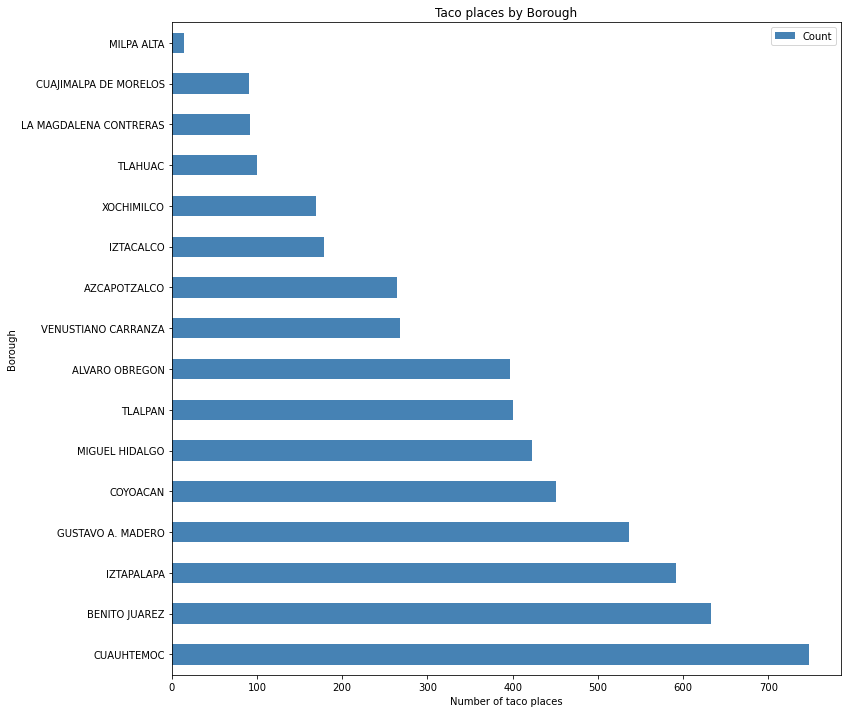

In [70]:
Tacos_count.set_index('Borough', inplace=True)
Tacos_count.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of taco places')
plt.title('Taco places by Borough')
plt.show()

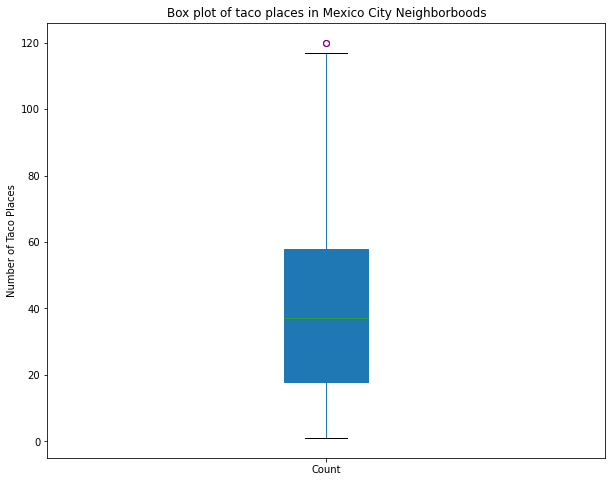

In [79]:
c="purple"
CDMX_tacosR2.plot(kind='box', figsize=(10, 8),patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color=c))

plt.title('Box plot of taco places in Mexico City Neighborboods')
plt.ylabel('Number of Taco Places')

plt.show()

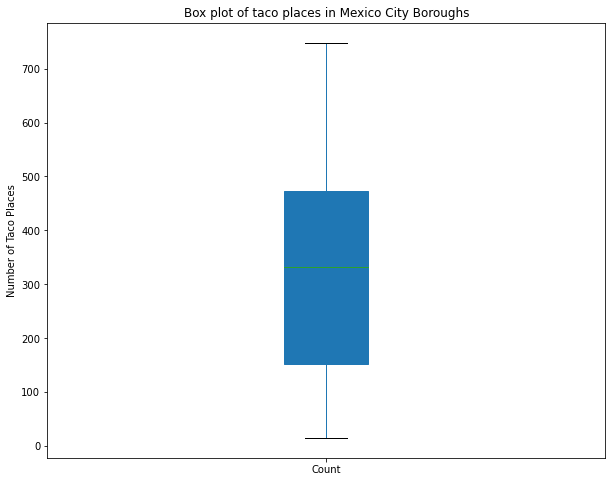

In [80]:
Tacos_count.plot(kind='box', figsize=(10, 8),patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color=c))

plt.title('Box plot of taco places in Mexico City Boroughs')
plt.ylabel('Number of Taco Places')
plt.show()

In [82]:
df_cdmx1=df_loc.loc[(df_loc['Borough'] == 'ALVARO OBREGON') | (df_loc['Borough']== 'MIGUEL HIDALGO') | (df_loc['Borough']== 'COYOACAN') |(df_loc['Borough']== 'IZTACALCO')]
df_cdmx1.reset_index(drop=True, inplace=True)
df_cdmx1

,Neighborhood,Borough,Latitude,Longitude
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513
3,PEDREGAL DE SANTA URSULA I,COYOACAN,19.314862237,-99.1477954505
4,AJUSCO I,COYOACAN,19.324571116,-99.1561602234
...,...,...,...,...
540,VILLA COYOACAN,COYOACAN,19.3473603624,-99.163099317
541,LOS OLIVOS (U HAB),COYOACAN,19.3126148113,-99.1347514239
542,LA VIRGEN 1170 (U HAB),COYOACAN,19.3235620501,-99.1041300516
543,TAXQUEA,COYOACAN,19.3392324,-99.1232106865


In [169]:
def getNearbyVenues2(names, latitudes, longitudes, radius=800):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']

    return(nearby_venues)

In [170]:
CDMX_venues = getNearbyVenues2(names=df_cdmx1['Neighborhood'],
                                   latitudes=df_cdmx1['Latitude'],
                                   longitudes=df_cdmx1['Longitude'])

In [216]:
print(CDMX_venues.shape)
CDMX_venues2=CDMX_venues.copy()
CDMX_venues.head()

(29707, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Studio Gourmet,19.420263,-99.215545,Gastropub
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Loma Linda,19.420156,-99.218127,Steakhouse
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,City Market,19.418977,-99.214751,Gourmet Shop
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Los Tulipanes,19.426797,-99.213360,Bakery
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,punto i coma,19.418724,-99.213941,Accessories Store


In [240]:
df_cdmx2=df_cdmx1.copy()

In [172]:
#CDMX_venues2.rename(columns={"Neighborhood Latitude": 'Latitude',"Neighborhood Longitude": 'Longitude'},inplace=True)
#CDMX_venues3 = pd.merge(CDMX_venues2, df_cdmx1, how="left", on=['Latitude','Longitude'])
#CDMX_venues3.drop(['Neighborhood_y'], axis=1, inplace=True)
#CDMX_venues3.rename(columns={"Neighborhood_x": 'Neighborhood'},inplace=True)
CDMX_venues2=CDMX_venues2.drop_duplicates(subset=['Venue Latitude','Venue Longitude'], keep='last')
CDMX_venues2.reset_index(drop=True, inplace=True)
CDMX_venues2

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Barranca Barrilaco,19.422404,-99.219354,Park
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,La Guadiana,19.422073,-99.219306,Restaurant
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Piacere,19.424467,-99.211835,Furniture / Home Store
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,La michoacana,19.427407,-99.211129,Ice Cream Shop
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,El Extasis De Las Sirenas,19.421504,-99.209244,Seafood Restaurant
...,...,...,...,...,...,...,...
8185,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,El Taraskito,19.327451,-99.124601,Taco Place
8186,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Taqueria Don paco,19.326758,-99.119738,Taco Place
8187,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Mercado Mercalli S. XXI,19.326143,-99.119859,Market
8188,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Cereza Café Coffe Shop,19.326284,-99.119840,Coffee Shop


In [217]:
CDMX_v2=CDMX_venues2.groupby(['Neighborhood'],as_index=False).count()
CDMX_v2.drop(['Neighborhood Latitude','Neighborhood Longitude','Venue','Venue Latitude','Venue Longitude'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
CDMX_v2.rename(columns={'Venue Category':'Count'}, inplace=True)
CDMX_v2=CDMX_v2.sort_values('Count', ascending=False)
CDMX_v2.reset_index(drop=True, inplace=True)
CDMX_v2

,Neighborhood,Count
0,CHIMALISTAC,200
1,EL MIRADOR,142
2,JARDINES DEL PEDREGAL,142
3,REFORMA SOCIAL,100
4,SAN MATEO (BARR),100
...,...,...
536,LOMAS DE LA ERA,7
537,PARAJE EL CABALLITO,7
538,SANTA ROSA XOCHIAC (PBLO),6
539,LOMAS DE CHAMONTOYA,4


In [199]:
df_eliminados=CDMX_v2.loc[(CDMX_v2['Count']<20)]
df_eliminados

,Neighborhood,Count
490,TLACUITLAPA,19
491,EMANCIPACION DEL PUEBLO,19
492,TORRES DE POTRERO,19
493,ARBOLEDAS POLITOCO,19
494,LOS CEDROS,19
495,ESTADO DE HIDALGO_,19
496,LA PRESA SECCION HORNOS,19
497,LOMAS DE CENTENARIO (U HAB),19
498,CORPUS CURISTY AMPL XOCOMECATLA,18
499,LA ARAA,18


In [218]:
df_eliminados=CDMX_v2.loc[(CDMX_v2['Count']<20)]
eliminados=df_eliminados['Neighborhood'].to_list()
for eliminado in eliminados:
    CDMX_venues2.drop(CDMX_venues2.loc[CDMX_venues2['Neighborhood']==eliminado].index, inplace=True)
CDMX_venues2.reset_index(drop=True, inplace=True)


In [241]:
for eliminado in eliminados:
    df_cdmx2.drop(df_cdmx2.loc[df_cdmx2['Neighborhood']==eliminado].index, inplace=True)
df_cdmx2.reset_index(drop=True, inplace=True)


In [219]:
CDMX_venues22=CDMX_venues2.copy()
CDMX_venues2

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Studio Gourmet,19.420263,-99.215545,Gastropub
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Loma Linda,19.420156,-99.218127,Steakhouse
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,City Market,19.418977,-99.214751,Gourmet Shop
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Los Tulipanes,19.426797,-99.213360,Bakery
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,punto i coma,19.418724,-99.213941,Accessories Store
...,...,...,...,...,...,...,...
28979,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,El Taraskito,19.327451,-99.124601,Taco Place
28980,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Taqueria Don paco,19.326758,-99.119738,Taco Place
28981,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Mercado Mercalli S. XXI,19.326143,-99.119859,Market
28982,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Cereza Café Coffe Shop,19.326284,-99.119840,Coffee Shop


In [220]:
CDMX_venues22.rename(columns={"Neighborhood Latitude": 'Latitude',"Neighborhood Longitude": 'Longitude'},inplace=True)
CDMX_venues3 = pd.merge(CDMX_venues22, df_cdmx1, how="left", on=['Latitude','Longitude'])
CDMX_venues3.drop(['Neighborhood_y'], axis=1, inplace=True)
CDMX_venues3.rename(columns={"Neighborhood_x": 'Neighborhood'},inplace=True)
CDMX_venues3

,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Borough
0,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Studio Gourmet,19.420263,-99.215545,Gastropub,MIGUEL HIDALGO
1,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Loma Linda,19.420156,-99.218127,Steakhouse,MIGUEL HIDALGO
2,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,City Market,19.418977,-99.214751,Gourmet Shop,MIGUEL HIDALGO
3,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,Los Tulipanes,19.426797,-99.213360,Bakery,MIGUEL HIDALGO
4,LOMAS DE CHAPULTEPEC,19.4228411174,-99.2157935754,punto i coma,19.418724,-99.213941,Accessories Store,MIGUEL HIDALGO
...,...,...,...,...,...,...,...,...
28979,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,El Taraskito,19.327451,-99.124601,Taco Place,COYOACAN
28980,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Taqueria Don paco,19.326758,-99.119738,Taco Place,COYOACAN
28981,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Mercado Mercalli S. XXI,19.326143,-99.119859,Market,COYOACAN
28982,EX EJIDO SAN FRANCISCO CULHUACAN III,19.3307417643,-99.1221305228,Cereza Café Coffe Shop,19.326284,-99.119840,Coffee Shop,COYOACAN


In [221]:
print('There are {} uniques categories.'.format(len(CDMX_venues2['Venue Category'].unique())))

There are 383 uniques categories.


In [222]:
#marking what kind of place it is with dummy variables
# one hot encoding
CDMX_onehot = pd.get_dummies(CDMX_venues2[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
CDMX_onehot['Neighborhood'] = CDMX_venues2['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [CDMX_onehot.columns[-1]] + list(CDMX_onehot.columns[:-1])
CDMX_onehot = CDMX_onehot[fixed_columns]

CDMX_onehot.head()

,Zoo Exhibit,ATM,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Warehouse Store,Water Park,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [223]:
CDMX_onehot2 = pd.get_dummies(CDMX_venues3[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
CDMX_onehot2['Borough'] = CDMX_venues3['Borough'] 

# move neighborhood column to the first column
fixed_columns2 = [CDMX_onehot2.columns[-1]] + list(CDMX_onehot2.columns[:-1])
CDMX_onehot2 = CDMX_onehot2[fixed_columns2]

CDMX_onehot2.head()

,Borough,ATM,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Water Park,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant,Zoo,Zoo Exhibit
0,MIGUEL HIDALGO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,MIGUEL HIDALGO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,MIGUEL HIDALGO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,MIGUEL HIDALGO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,MIGUEL HIDALGO,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [224]:
CDMX_grouped = CDMX_onehot.groupby('Neighborhood').mean().reset_index()
CDMX_grouped.head()

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Warehouse Store,Water Park,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant,Zoo
0,10 DE ABRIL,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.020408,0.0,0.0
1,16 DE SEPTIEMBRE,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,19 DE MAYO,0.0,0.0,0.0,0.0,0.025,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3,1RA VICTORIA,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4,1RA VICTORIA SECCION BOSQUES,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.016129,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [225]:
CDMX_grouped2 = CDMX_onehot2.groupby('Borough').mean().reset_index()
CDMX_grouped2.head()

,Borough,ATM,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Water Park,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant,Zoo,Zoo Exhibit
0,ALVARO OBREGON,0.000803,0.000115,0.000000,0.001835,0.000000,0.000229,0.000000,0.002982,0.000688,...,0.000000,0.000344,0.000459,0.000459,0.004358,0.000688,0.003899,0.000000,0.000115,0.000688
1,COYOACAN,0.000183,0.000642,0.000000,0.003024,0.000000,0.000917,0.000000,0.007607,0.002200,...,0.000000,0.001008,0.000275,0.000092,0.005774,0.001650,0.001283,0.000000,0.000000,0.000458
2,IZTACALCO,0.000000,0.000000,0.000000,0.001299,0.000325,0.000650,0.000000,0.004872,0.002923,...,0.000974,0.000000,0.000000,0.000974,0.011043,0.001624,0.000000,0.000974,0.000000,0.000000
3,MIGUEL HIDALGO,0.000000,0.001913,0.000956,0.002391,0.000319,0.000000,0.002072,0.004463,0.005260,...,0.000000,0.000159,0.000638,0.000319,0.003507,0.000159,0.003666,0.000000,0.000319,0.000000


In [226]:
#Giving a top 5 with the more kind of venues for each neighborhood
num_top_venues = 5

for borough in CDMX_grouped2['Borough']:
    print("----"+borough+"----")
    temp2 = CDMX_grouped2[CDMX_grouped2['Borough'] == borough].T.reset_index() #recordar que hood es el indice
    temp2.columns = ['venue','freq']
    temp2 = temp2.iloc[1:]
    temp2['freq'] = temp2['freq'].astype(float)
    temp2 = temp2.round({'freq': 2})
    print(temp2.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ALVARO OBREGON----
                venue  freq
0          Taco Place  0.12
1  Mexican Restaurant  0.10
2        Burger Joint  0.04
3         Coffee Shop  0.04
4         Pizza Place  0.03


----COYOACAN----
                venue  freq
0  Mexican Restaurant  0.10
1          Taco Place  0.09
2         Coffee Shop  0.04
3      Ice Cream Shop  0.04
4         Pizza Place  0.03


----IZTACALCO----
                venue  freq
0          Taco Place  0.13
1  Mexican Restaurant  0.13
2              Bakery  0.04
3   Convenience Store  0.04
4  Seafood Restaurant  0.03


----MIGUEL HIDALGO----
                venue  freq
0  Mexican Restaurant  0.10
1          Taco Place  0.08
2         Coffee Shop  0.05
3          Restaurant  0.04
4              Bakery  0.03




In [227]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [242]:
#Giving a dataframe with the top 10 with the more kind of venues for each neighborhood

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = CDMX_grouped['Neighborhood']

for ind in np.arange(CDMX_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(CDMX_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,10 DE ABRIL,Mexican Restaurant,Restaurant,Taco Place,Park,Convenience Store,Pharmacy,Gym / Fitness Center,Café,Food Truck,Bakery
1,16 DE SEPTIEMBRE,Mexican Restaurant,Taco Place,Convenience Store,Seafood Restaurant,Pharmacy,Coffee Shop,Restaurant,Brewery,Food Truck,Furniture / Home Store
2,19 DE MAYO,Mexican Restaurant,Restaurant,Coffee Shop,Convenience Store,Burger Joint,Taco Place,Tea Room,Brazilian Restaurant,Dessert Shop,Garden
3,1RA VICTORIA,Taco Place,Mexican Restaurant,Park,Football Stadium,Bar,Garden Center,Soup Place,Seafood Restaurant,Housing Development,Restaurant
4,1RA VICTORIA SECCION BOSQUES,Taco Place,Mexican Restaurant,Gym / Fitness Center,Coffee Shop,Burger Joint,Park,Pharmacy,Restaurant,Bar,Building
...,...,...,...,...,...,...,...,...,...,...,...
485,VISTAS DEL MAUREL (U HAB),Mexican Restaurant,Taco Place,Ice Cream Shop,Gym,Clothing Store,Park,Concert Hall,Flea Market,Market,Furniture / Home Store
486,XOTEPINGO,Mexican Restaurant,Park,Restaurant,Taco Place,Bakery,Seafood Restaurant,Coffee Shop,Museum,Pizza Place,BBQ Joint
487,ZAPOTLA,Mexican Restaurant,Taco Place,Convenience Store,Restaurant,Food Truck,Bar,BBQ Joint,Bakery,Seafood Restaurant,Coffee Shop
488,ZENON DELGADO,Taco Place,Coffee Shop,Flea Market,Burger Joint,Convenience Store,Seafood Restaurant,Mexican Restaurant,Bakery,Fried Chicken Joint,Food Truck


In [229]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns2 = ['Borough']
for ind in np.arange(num_top_venues):
    try:
        columns2.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns2.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted2 = pd.DataFrame(columns=columns2)
neighborhoods_venues_sorted2['Borough'] = CDMX_grouped2['Borough']

for ind in np.arange(CDMX_grouped2.shape[0]):
    neighborhoods_venues_sorted2.iloc[ind, 1:] = return_most_common_venues(CDMX_grouped2.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted2

,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALVARO OBREGON,Taco Place,Mexican Restaurant,Burger Joint,Coffee Shop,Pizza Place,Convenience Store,Restaurant,Bakery,Seafood Restaurant,Gym
1,COYOACAN,Mexican Restaurant,Taco Place,Ice Cream Shop,Coffee Shop,Restaurant,Pizza Place,Park,Bakery,Seafood Restaurant,Convenience Store
2,IZTACALCO,Taco Place,Mexican Restaurant,Bakery,Convenience Store,Restaurant,Coffee Shop,Seafood Restaurant,Burger Joint,BBQ Joint,Food Truck
3,MIGUEL HIDALGO,Mexican Restaurant,Taco Place,Coffee Shop,Restaurant,Bakery,Burger Joint,Café,Ice Cream Shop,Seafood Restaurant,Pizza Place


In [243]:
CDMX_grouped_clustering = CDMX_grouped.drop('Neighborhood', 1)

In [236]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0)
    kmeanModel.fit(CDMX_grouped_clustering )
    distortions.append(kmeanModel.inertia_)

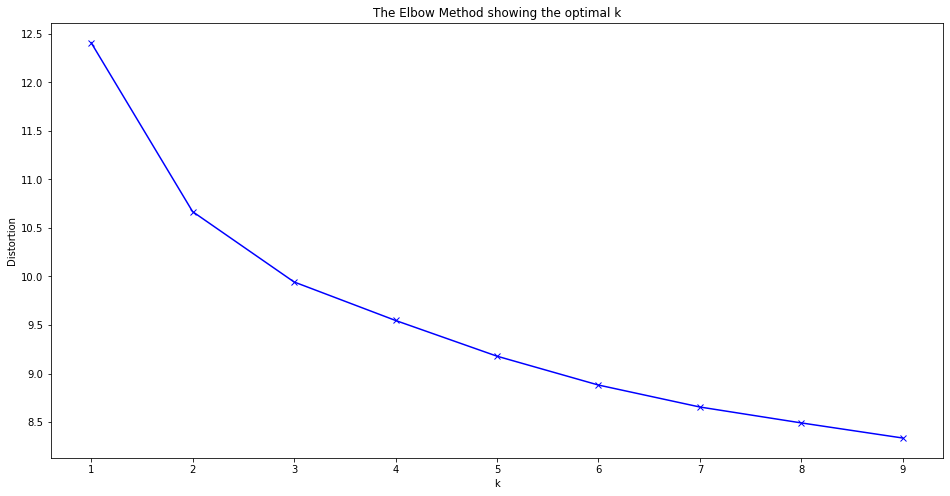

In [237]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

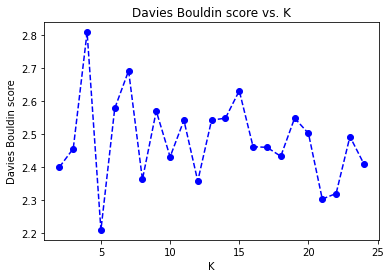

In [233]:
# Davies Bouldin score for K means
from sklearn.metrics import davies_bouldin_score
def get_kmeans_score(data, center):
    '''
    returns the kmeans score regarding Davies Bouldin for points to centers
    INPUT:
        data - the dataset you want to fit kmeans to
        center - the number of centers you want (the k value)
    OUTPUT:
        score - the Davies Bouldin score for the kmeans model fit to the data
    '''
    #instantiate kmeans
    kmeans = KMeans(n_clusters=center)
# Then fit the model to your data using the fit method
    model = kmeans.fit_predict(CDMX_grouped_clustering)
    
    # Calculate Davies Bouldin score
    score = davies_bouldin_score(CDMX_grouped_clustering, model)
    
    return score
scores = []
centers = list(range(2,25))
for center in centers:
    scores.append(get_kmeans_score(CDMX_grouped_clustering, center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

In [244]:
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(CDMX_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:20] 

array([4, 0, 1, 2, 4, 0, 0, 0, 0, 4, 2, 4, 2, 0, 0, 0, 2, 0, 0, 2],
      dtype=int32)

In [245]:
# add clustering labels
neighborhoods_venues_sorted.insert(0,'Cluster Labels', kmeans.labels_)

CDMX_merged = df_cdmx2.copy()
nan_rows1 = neighborhoods_venues_sorted[neighborhoods_venues_sorted.isnull().any(1)]
# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
CDMX_merged = CDMX_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
nan_rows2 = CDMX_merged[CDMX_merged.isnull().any(1)]
#CDMX_merged['Cluster Labels']=CDMX_merged['Cluster Labels'].astype(int)
CDMX_merged.head() 

,Neighborhood,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754,1,Coffee Shop,Restaurant,Seafood Restaurant,Bakery,Taco Place,Spa,Café,Mexican Restaurant,Gourmet Shop,Music Venue
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268,1,Bookstore,Park,Scenic Lookout,Mexican Restaurant,Photography Lab,Dance Studio,Bakery,Mediterranean Restaurant,Japanese Restaurant,Pharmacy
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513,1,Coffee Shop,Café,Taco Place,Mexican Restaurant,Ice Cream Shop,Bakery,Restaurant,Italian Restaurant,Seafood Restaurant,Gym
3,PEDREGAL DE SANTA URSULA I,COYOACAN,19.314862237,-99.1477954505,4,Mexican Restaurant,Taco Place,Soccer Field,Bar,Seafood Restaurant,Market,Convenience Store,Snack Place,Bowling Alley,Flower Shop
4,AJUSCO I,COYOACAN,19.324571116,-99.1561602234,2,Taco Place,Ice Cream Shop,Mexican Restaurant,Convenience Store,Café,Bakery,Brewery,Coffee Shop,Wings Joint,Soup Place


In [246]:
# create map with clusters
map_clusters = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(CDMX_merged['Latitude'], CDMX_merged['Longitude'], CDMX_merged['Neighborhood'], CDMX_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [247]:
cluster1=CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 0, CDMX_merged.columns[[0] +[1]+ list(range(2, CDMX_merged.shape[1]))]]
CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 0, CDMX_merged.columns[[0] +[1]+ list(range(5, CDMX_merged.shape[1]))]]

,Neighborhood,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,5 DE MAYO,MIGUEL HIDALGO,Taco Place,Mexican Restaurant,Restaurant,Coffee Shop,Burger Joint,Gym / Fitness Center,Bakery,Food Court,Park,Gym
11,SAN FRANCISCO CULHUACAN (PBLO),COYOACAN,Mexican Restaurant,Taco Place,Seafood Restaurant,Bakery,Park,Flea Market,Pizza Place,Coffee Shop,Wings Joint,Music Venue
14,LA ASUNCION,IZTACALCO,Mexican Restaurant,Taco Place,Restaurant,Convenience Store,Seafood Restaurant,Bakery,Park,Dog Run,Brewery,Market
15,EX EJIDOS DE LA MAGDALENA MIXIHUCA,IZTACALCO,Taco Place,Mexican Restaurant,Bar,Seafood Restaurant,Racetrack,Fried Chicken Joint,Burger Joint,Flea Market,Convenience Store,BBQ Joint
28,NUEVA STA ANITA,IZTACALCO,Mexican Restaurant,Taco Place,Restaurant,Argentinian Restaurant,Convenience Store,Bakery,Seafood Restaurant,Bar,Burger Joint,Gym
...,...,...,...,...,...,...,...,...,...,...,...,...
470,AGRICOLA ORIENTAL I,IZTACALCO,Taco Place,Mexican Restaurant,Gym / Fitness Center,Soccer Stadium,Food Truck,Department Store,Racetrack,Restaurant,Gym,Market
472,TLACOTAL RAMOS MILLAN,IZTACALCO,Mexican Restaurant,Taco Place,Seafood Restaurant,Snack Place,Burger Joint,Flea Market,Coffee Shop,Restaurant,Beer Garden,Dessert Shop
473,CAMPAMENTO 2 DE OCTUBRE II,IZTACALCO,Mexican Restaurant,Taco Place,Coffee Shop,Convenience Store,Playground,Restaurant,Park,Bakery,Seafood Restaurant,Gastropub
488,SANTA URSULA COAPA (PBLO),COYOACAN,Taco Place,Mexican Restaurant,Food Truck,Bar,Soccer Field,Gym,Market,Coffee Shop,Diner,Office


In [249]:
# create map with clusters
map_clusters1 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster1['Latitude'], cluster1['Longitude'], cluster1['Neighborhood'], cluster1['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters1)
       
map_clusters1


In [261]:
cluster2=CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 1, CDMX_merged.columns[[0] +[1]+ list(range(2, CDMX_merged.shape[1]))]]
CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 1, CDMX_merged.columns[[0] +[1]+ list(range(5, CDMX_merged.shape[1]))]]

,Neighborhood,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,Coffee Shop,Restaurant,Seafood Restaurant,Bakery,Taco Place,Spa,Café,Mexican Restaurant,Gourmet Shop,Music Venue
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,Bookstore,Park,Scenic Lookout,Mexican Restaurant,Photography Lab,Dance Studio,Bakery,Mediterranean Restaurant,Japanese Restaurant,Pharmacy
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,Coffee Shop,Café,Taco Place,Mexican Restaurant,Ice Cream Shop,Bakery,Restaurant,Italian Restaurant,Seafood Restaurant,Gym
8,CAMPESTRE COYOACAN (FRACC),COYOACAN,Mexican Restaurant,Taco Place,Convenience Store,Park,Coffee Shop,Restaurant,Food Truck,Burger Joint,Soccer Stadium,Seafood Restaurant
10,EMILIANO ZAPATA,COYOACAN,Restaurant,Mexican Restaurant,Taco Place,Park,Ice Cream Shop,Bakery,Museum,Spa,Coffee Shop,Breakfast Spot
...,...,...,...,...,...,...,...,...,...,...,...,...
483,ANAHUAC II,MIGUEL HIDALGO,Mexican Restaurant,Coffee Shop,Taco Place,Gym,Café,Burger Joint,Restaurant,Steakhouse,Convenience Store,Gym / Fitness Center
484,ALTILLO (COND ALTILLO UNIVERSIDAD),COYOACAN,Coffee Shop,Pizza Place,Mexican Restaurant,Taco Place,Bookstore,Café,Clothing Store,Ice Cream Shop,Breakfast Spot,Cosmetics Shop
486,DEL NIO JESUS (BARR),COYOACAN,Food Truck,Coffee Shop,Mexican Restaurant,Vegetarian / Vegan Restaurant,Italian Restaurant,Pizza Place,Café,Shopping Mall,Restaurant,Fast Food Restaurant
487,PEDREGAL DE SAN FRANCISCO (FRACC),COYOACAN,Mexican Restaurant,Coffee Shop,Pizza Place,Restaurant,Food Truck,Italian Restaurant,Convenience Store,Burger Joint,National Park,Bakery


In [262]:
# create map with clusters
map_clusters2 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster2['Latitude'], cluster2['Longitude'], cluster2['Neighborhood'], cluster2['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters2)
       
map_clusters2

In [259]:
cluster3=CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 2, CDMX_merged.columns[[0] +[1]+ list(range(2, CDMX_merged.shape[1]))]]
CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 2, CDMX_merged.columns[[0] +[1]+ list(range(5, CDMX_merged.shape[1]))]]

,Neighborhood,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,AJUSCO I,COYOACAN,Taco Place,Ice Cream Shop,Mexican Restaurant,Convenience Store,Café,Bakery,Brewery,Coffee Shop,Wings Joint,Soup Place
16,OLIVAR DEL CONDE 2DA SECCION I,ALVARO OBREGON,Taco Place,Food Truck,Pharmacy,Park,Sushi Restaurant,Gym,Diner,Athletics & Sports,Asian Restaurant,Mexican Restaurant
17,OLIVAR DEL CONDE 1RA SECCION II,ALVARO OBREGON,Taco Place,Mexican Restaurant,Burger Joint,Pizza Place,Asian Restaurant,Sushi Restaurant,Shoe Store,Drugstore,Park,Food Truck
18,1RA VICTORIA,ALVARO OBREGON,Taco Place,Mexican Restaurant,Park,Football Stadium,Bar,Garden Center,Soup Place,Seafood Restaurant,Housing Development,Restaurant
24,PUNTA DE CEHUAYO,ALVARO OBREGON,Taco Place,Convenience Store,Burger Joint,Gym,Park,Market,Dessert Shop,Bakery,Coffee Shop,BBQ Joint
...,...,...,...,...,...,...,...,...,...,...,...,...
441,POPOTLA I,MIGUEL HIDALGO,Taco Place,Gym,Convenience Store,Pizza Place,Shipping Store,Gymnastics Gym,Burger Joint,Mexican Restaurant,Historic Site,Restaurant
462,LA MEXICANA (AMPL),ALVARO OBREGON,Mexican Restaurant,Taco Place,Burger Joint,Convenience Store,Gym,Gym / Fitness Center,Memorial Site,Park,Shopping Mall,Pharmacy
466,JOSE MARIA PINO SUAREZ,ALVARO OBREGON,Taco Place,Mexican Restaurant,Restaurant,Pharmacy,Coffee Shop,Gym / Fitness Center,Food Truck,Burger Joint,Seafood Restaurant,Furniture / Home Store
468,EL RUEDO,ALVARO OBREGON,Taco Place,Convenience Store,Park,Pharmacy,Basketball Court,Coffee Shop,Bakery,Athletics & Sports,Gym,Gym / Fitness Center


In [260]:
map_clusters3 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster3['Latitude'], cluster3['Longitude'], cluster3['Neighborhood'], cluster3['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters3)
       
map_clusters3

In [254]:
cluster4=CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 3, CDMX_merged.columns[[0] +[1]+ list(range(2, CDMX_merged.shape[1]))]]
CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 3, CDMX_merged.columns[[0] +[1]+ list(range(5, CDMX_merged.shape[1]))]]

,Neighborhood,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,PILOTO (ADOLFO LOPEZ MATEOS),ALVARO OBREGON,Burger Joint,Mexican Restaurant,Taco Place,Pizza Place,Soccer Field,Market,Bar,BBQ Joint,Sushi Restaurant,Supermarket
45,LOMAS DE PUERTA GRANDE,ALVARO OBREGON,Taco Place,Pizza Place,Convenience Store,Gym,Electronics Store,Mexican Restaurant,Sushi Restaurant,Shopping Mall,Pharmacy,Athletics & Sports
79,GARCIMARRERO REACOMODO,ALVARO OBREGON,Taco Place,Burger Joint,Pizza Place,Mexican Restaurant,Park,Lounge,Sushi Restaurant,Market,Supermarket,Seafood Restaurant
80,GARCIMARRERO,ALVARO OBREGON,Taco Place,Mexican Restaurant,Burger Joint,Pizza Place,Lounge,Market,Theme Park,Bar,Supermarket,Bakery
104,LA MARTINICA,ALVARO OBREGON,Pizza Place,Taco Place,Pharmacy,Dog Run,Convenience Store,Park,Mexican Restaurant,Athletics & Sports,Electronics Store,Hobby Shop
113,ARCOS DE CENTENARIO,ALVARO OBREGON,Pizza Place,Mexican Restaurant,Burger Joint,Nature Preserve,Coffee Shop,Shopping Mall,River,Electronics Store,Street Art,Athletics & Sports
123,PROF JOSE ARTURO LOPEZ,ALVARO OBREGON,Mexican Restaurant,Dog Run,Pizza Place,Soccer Field,Pharmacy,Stationery Store,Taco Place,Nature Preserve,Basketball Court,Food Truck
126,VALENTIN GOMEZ FARIAS,ALVARO OBREGON,Taco Place,Pizza Place,Burger Joint,Convenience Store,Pharmacy,Basketball Court,Market,Fabric Shop,Scenic Lookout,Mexican Restaurant
147,PILOTO (ADOLFO LOPEZ MATEOS) (AMPL),ALVARO OBREGON,Mexican Restaurant,Burger Joint,Taco Place,Gym,Pizza Place,Pub,BBQ Joint,Farmers Market,Farm,Shopping Mall
197,CANUTILLO PREDIO LA PRESA,ALVARO OBREGON,Pizza Place,Burger Joint,Mexican Restaurant,Taco Place,Market,Gym,Convenience Store,Electronics Store,Scenic Lookout,Seafood Restaurant


In [255]:
map_clusters4 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster4['Latitude'], cluster4['Longitude'], cluster4['Neighborhood'], cluster4['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters4)
       
map_clusters4

In [257]:
cluster5=CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 4, CDMX_merged.columns[[0] +[1]+ list(range(2, CDMX_merged.shape[1]))]]
CDMX_merged.loc[CDMX_merged['Cluster Labels'] == 4, CDMX_merged.columns[[0] +[1]+ list(range(5, CDMX_merged.shape[1]))]]

,Neighborhood,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,PEDREGAL DE SANTA URSULA I,COYOACAN,Mexican Restaurant,Taco Place,Soccer Field,Bar,Seafood Restaurant,Market,Convenience Store,Snack Place,Bowling Alley,Flower Shop
5,VISTAS DEL MAUREL (U HAB),COYOACAN,Mexican Restaurant,Taco Place,Ice Cream Shop,Gym,Clothing Store,Park,Concert Hall,Flea Market,Market,Furniture / Home Store
7,PLUTARCO ELIAS CALLES,MIGUEL HIDALGO,Mexican Restaurant,Taco Place,Convenience Store,Sushi Restaurant,Breakfast Spot,Restaurant,Athletics & Sports,Food Truck,Bar,BBQ Joint
9,CTM X CULHUACAN (U HAB),COYOACAN,Mexican Restaurant,Convenience Store,Gym / Fitness Center,Taco Place,Pizza Place,Park,Seafood Restaurant,Coffee Shop,Restaurant,Burger Joint
12,PARQUE SAN ANDRES,COYOACAN,Taco Place,Mexican Restaurant,Café,Restaurant,Convenience Store,Food Truck,Pharmacy,Vegetarian / Vegan Restaurant,Furniture / Home Store,Indie Theater
...,...,...,...,...,...,...,...,...,...,...,...,...
480,10 DE ABRIL,MIGUEL HIDALGO,Mexican Restaurant,Restaurant,Taco Place,Park,Convenience Store,Pharmacy,Gym / Fitness Center,Café,Food Truck,Bakery
481,CAMPESTRE CHURUBUSCO,COYOACAN,Coffee Shop,Mexican Restaurant,Taco Place,Restaurant,Pharmacy,Café,Pizza Place,Burger Joint,Ice Cream Shop,Diner
485,CENTRO URBANO TLALPAN (U HAB),COYOACAN,Taco Place,Mexican Restaurant,Bakery,Restaurant,Pizza Place,Burger Joint,Pet Store,Coffee Shop,Park,Pharmacy
490,LOS OLIVOS (U HAB),COYOACAN,Taco Place,Mexican Restaurant,Restaurant,Burger Joint,Coffee Shop,Gym / Fitness Center,Seafood Restaurant,Gym,Breakfast Spot,Ice Cream Shop


In [258]:
map_clusters5 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster5['Latitude'], cluster5['Longitude'], cluster5['Neighborhood'], cluster5['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters5)
       
map_clusters5

In [279]:
cluster2

,Neighborhood,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754,1,Coffee Shop,Restaurant,Seafood Restaurant,Bakery,Taco Place,Spa,Café,Mexican Restaurant,Gourmet Shop,Music Venue
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268,1,Bookstore,Park,Scenic Lookout,Mexican Restaurant,Photography Lab,Dance Studio,Bakery,Mediterranean Restaurant,Japanese Restaurant,Pharmacy
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513,1,Coffee Shop,Café,Taco Place,Mexican Restaurant,Ice Cream Shop,Bakery,Restaurant,Italian Restaurant,Seafood Restaurant,Gym
8,CAMPESTRE COYOACAN (FRACC),COYOACAN,19.3088228782,-99.1170550984,1,Mexican Restaurant,Taco Place,Convenience Store,Park,Coffee Shop,Restaurant,Food Truck,Burger Joint,Soccer Stadium,Seafood Restaurant
10,EMILIANO ZAPATA,COYOACAN,19.326716273,-99.1380465169,1,Restaurant,Mexican Restaurant,Taco Place,Park,Ice Cream Shop,Bakery,Museum,Spa,Coffee Shop,Breakfast Spot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
483,ANAHUAC II,MIGUEL HIDALGO,19.4412164017,-99.177507046,1,Mexican Restaurant,Coffee Shop,Taco Place,Gym,Café,Burger Joint,Restaurant,Steakhouse,Convenience Store,Gym / Fitness Center
484,ALTILLO (COND ALTILLO UNIVERSIDAD),COYOACAN,19.340792545,-99.1807109116,1,Coffee Shop,Pizza Place,Mexican Restaurant,Taco Place,Bookstore,Café,Clothing Store,Ice Cream Shop,Breakfast Spot,Cosmetics Shop
486,DEL NIO JESUS (BARR),COYOACAN,19.3414112805,-99.1589499218,1,Food Truck,Coffee Shop,Mexican Restaurant,Vegetarian / Vegan Restaurant,Italian Restaurant,Pizza Place,Café,Shopping Mall,Restaurant,Fast Food Restaurant
487,PEDREGAL DE SAN FRANCISCO (FRACC),COYOACAN,19.3388204534,-99.1661922139,1,Mexican Restaurant,Coffee Shop,Pizza Place,Restaurant,Food Truck,Italian Restaurant,Convenience Store,Burger Joint,National Park,Bakery


In [278]:
cluster2_loc=cluster2.groupby(['Borough'],as_index=False).count()
cluster2_loc.drop(['Latitude','Longitude','Neighborhood','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_loc.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_loc=cluster2_loc.sort_values('Count', ascending=False)
cluster2_loc.reset_index(drop=True, inplace=True)
cluster2_loc

,Borough,Count
0,COYOACAN,44
1,MIGUEL HIDALGO,42
2,ALVARO OBREGON,24
3,IZTACALCO,2


In [282]:
cluster2_a=cluster2.groupby(['1st Most Common Venue'],as_index=False).count()
cluster2_a.drop(['Latitude','Longitude','Neighborhood','Borough','2nd Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_a.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_a=cluster2_a.sort_values('Count', ascending=False)
cluster2_a.reset_index(drop=True, inplace=True)
cluster2_a.head(10)

,1st Most Common Venue,Count
0,Mexican Restaurant,49
1,Coffee Shop,22
2,Taco Place,8
3,Restaurant,4
4,Park,4
5,Clothing Store,3
6,Athletics & Sports,2
7,Gym / Fitness Center,2
8,Boutique,2
9,Dog Run,1


In [283]:
cluster2_b=cluster2.groupby(['2nd Most Common Venue'],as_index=False).count()
cluster2_b.drop(['Latitude','Longitude','Neighborhood','Borough','1st Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_b.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_b=cluster2_b.sort_values('Count', ascending=False)
cluster2_b.reset_index(drop=True, inplace=True)
cluster2_b.head(10)

,2nd Most Common Venue,Count
0,Coffee Shop,24
1,Mexican Restaurant,18
2,Clothing Store,8
3,Ice Cream Shop,8
4,Taco Place,7
5,Restaurant,7
6,Café,7
7,Park,6
8,Gym / Fitness Center,2
9,Seafood Restaurant,2


In [284]:
cluster2_c=cluster2.groupby(['3rd Most Common Venue'],as_index=False).count()
cluster2_c.drop(['Latitude','Longitude','Neighborhood','Borough','1st Most Common Venue','2nd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_c.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_c=cluster2_c.sort_values('Count', ascending=False)
cluster2_c.reset_index(drop=True, inplace=True)
cluster2_c.head(10)

,3rd Most Common Venue,Count
0,Taco Place,14
1,Ice Cream Shop,14
2,Mexican Restaurant,11
3,Restaurant,7
4,Park,6
5,Coffee Shop,6
6,Bakery,5
7,Café,5
8,Pizza Place,4
9,Gym / Fitness Center,3


In [288]:
cluster2_droppedout=cluster2.loc[(cluster2['1st Most Common Venue']== 'Taco Place') | (cluster2['2nd Most Common Venue']== 'Taco Place')
                                 |(cluster2['3rd Most Common Venue']== 'Taco Place')]
cluster2_droppedout

,Neighborhood,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,DEL BOSQUE (POLANCO),MIGUEL HIDALGO,19.4342189235,-99.2094037513,1,Coffee Shop,Café,Taco Place,Mexican Restaurant,Ice Cream Shop,Bakery,Restaurant,Italian Restaurant,Seafood Restaurant,Gym
8,CAMPESTRE COYOACAN (FRACC),COYOACAN,19.3088228782,-99.1170550984,1,Mexican Restaurant,Taco Place,Convenience Store,Park,Coffee Shop,Restaurant,Food Truck,Burger Joint,Soccer Stadium,Seafood Restaurant
10,EMILIANO ZAPATA,COYOACAN,19.326716273,-99.1380465169,1,Restaurant,Mexican Restaurant,Taco Place,Park,Ice Cream Shop,Bakery,Museum,Spa,Coffee Shop,Breakfast Spot
13,OLIMPICA,COYOACAN,19.3042837028,-99.1700844887,1,Mexican Restaurant,Ice Cream Shop,Taco Place,Food Truck,Argentinian Restaurant,Furniture / Home Store,Clothing Store,Restaurant,Sandwich Place,Burger Joint
31,LA OTRA BANDA,ALVARO OBREGON,19.3368893242,-99.1950357519,1,Mexican Restaurant,Taco Place,Coffee Shop,Seafood Restaurant,Restaurant,Bar,Salad Place,Casino,Shopping Mall,Japanese Restaurant
72,PARQUE RESIDENCIAL SAN ANTONIO (U HAB),ALVARO OBREGON,19.386762383,-99.1924983439,1,Mexican Restaurant,Coffee Shop,Taco Place,Gym / Fitness Center,Food Truck,Food Court,Burger Joint,Ice Cream Shop,Pharmacy,Bakery
76,AXOTLA,ALVARO OBREGON,19.3583902692,-99.1749397946,1,Mexican Restaurant,Coffee Shop,Taco Place,Pet Store,Cosmetics Shop,Sushi Restaurant,Food Truck,Department Store,Bistro,Optical Shop
91,ANAHUAC LAGO SUR,MIGUEL HIDALGO,19.4451471007,-99.1872536573,1,Coffee Shop,Mexican Restaurant,Taco Place,Restaurant,Convenience Store,Café,Bakery,Ice Cream Shop,Dog Run,Burger Joint
97,ALIANZA POPULAR REVOLUCIONARIA NORTE (U HAB),COYOACAN,19.3190886855,-99.1204122575,1,Mexican Restaurant,Taco Place,Ice Cream Shop,Coffee Shop,Pharmacy,Pizza Place,Burger Joint,Gym / Fitness Center,Market,Food Truck
102,COPILCO EL BAJO,COYOACAN,19.3391294025,-99.1863816663,1,Coffee Shop,Taco Place,Ice Cream Shop,Breakfast Spot,Mexican Restaurant,Snack Place,Gym / Fitness Center,Bookstore,Food Truck,Sporting Goods Shop


In [301]:
cluster2_best=cluster2.loc[(cluster2['1st Most Common Venue']!= 'Taco Place') & (cluster2['2nd Most Common Venue']!= 'Taco Place')
                                 &(cluster2['3rd Most Common Venue']!= 'Taco Place')&(cluster2['4th Most Common Venue']!= 'Taco Place')]
cluster2_best.reset_index(drop=True, inplace=True)
cluster2_best

,Neighborhood,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,19.4228411174,-99.2157935754,1,Coffee Shop,Restaurant,Seafood Restaurant,Bakery,Taco Place,Spa,Café,Mexican Restaurant,Gourmet Shop,Music Venue
1,LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC),MIGUEL HIDALGO,19.4106158914,-99.2262487268,1,Bookstore,Park,Scenic Lookout,Mexican Restaurant,Photography Lab,Dance Studio,Bakery,Mediterranean Restaurant,Japanese Restaurant,Pharmacy
2,CHAPULTEPEC MORALES (POLANCO),MIGUEL HIDALGO,19.4343532798,-99.1866020156,1,Coffee Shop,Seafood Restaurant,Bakery,Pharmacy,Mexican Restaurant,Restaurant,Japanese Restaurant,Park,Breakfast Spot,Steakhouse
3,JARDINES DEL PEDREGAL,ALVARO OBREGON,19.3197415813,-99.2074193222,1,Boutique,Clothing Store,Ice Cream Shop,Jewelry Store,Mexican Restaurant,Cosmetics Shop,Shopping Mall,Coffee Shop,Movie Theater,Taco Place
4,METROPOLITANO (U HAB),ALVARO OBREGON,19.3604002285,-99.2183068464,1,Mexican Restaurant,Soccer Field,Dog Run,Athletics & Sports,Nature Preserve,Food Truck,Food,Street Art,Coffee Shop,Shopping Mall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,LOMAS DE SOTELO,MIGUEL HIDALGO,19.4492461991,-99.215268164,1,Mexican Restaurant,Clothing Store,Cosmetics Shop,Food Truck,Sporting Goods Shop,Taco Place,Gym / Fitness Center,Italian Restaurant,Movie Theater,Coffee Shop
68,PALMITAS (POLANCO),MIGUEL HIDALGO,19.4309018729,-99.2048424103,1,Coffee Shop,Café,Jewelry Store,Mexican Restaurant,Restaurant,Seafood Restaurant,Ice Cream Shop,Bakery,Steakhouse,Mediterranean Restaurant
69,DEL NIO JESUS (BARR),COYOACAN,19.3414112805,-99.1589499218,1,Food Truck,Coffee Shop,Mexican Restaurant,Vegetarian / Vegan Restaurant,Italian Restaurant,Pizza Place,Café,Shopping Mall,Restaurant,Fast Food Restaurant
70,PEDREGAL DE SAN FRANCISCO (FRACC),COYOACAN,19.3388204534,-99.1661922139,1,Mexican Restaurant,Coffee Shop,Pizza Place,Restaurant,Food Truck,Italian Restaurant,Convenience Store,Burger Joint,National Park,Bakery


In [318]:
cluster2_bestloc=cluster2_best.groupby(['Borough'],as_index=False).count()
cluster2_bestloc.drop(['Latitude','Longitude','Neighborhood','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_bestloc.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_bestloc=cluster2_bestloc.sort_values('Count', ascending=False)
cluster2_bestloc.reset_index(drop=True, inplace=True)
locacioncluster2=cluster2_bestloc
locacioncluster2

,Borough,Count
0,MIGUEL HIDALGO,32
1,COYOACAN,24
2,ALVARO OBREGON,15
3,IZTACALCO,1


In [340]:
locacioncluster2.set_index('Borough', inplace=True)


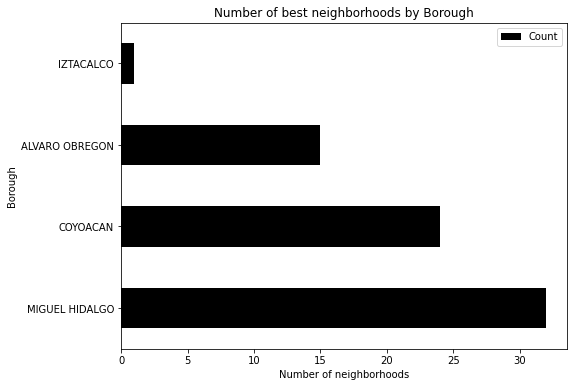

In [353]:
locacioncluster2.plot(kind='barh', figsize=(8, 6), color=['black', 'red', 'green', 'blue'])
plt.xlabel('Number of neighborhoods')
plt.title('Number of best neighborhoods by Borough')
#plt.bar(y_pos, height, color=['black', 'red', 'green', 'blue'])
#plt.xticks(y_pos, bars)

plt.show()

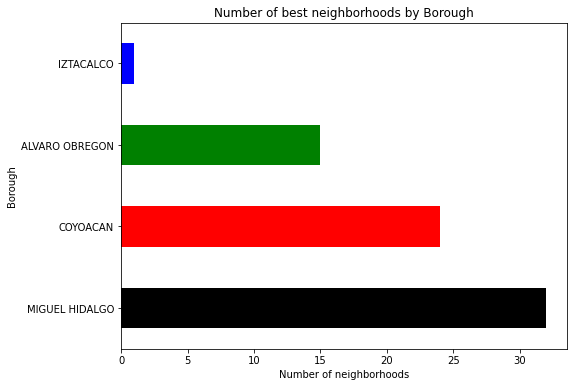

In [371]:

#plt.bar(, height, color=['black', 'red', 'green', 'blue'])
locacioncluster2['Count'].plot(kind="barh", figsize=(8, 6), color=['black', 'red', 'green', 'blue'])
plt.xlabel('Number of neighborhoods')
plt.title('Number of best neighborhoods by Borough')
plt.show()


In [329]:
locacioncluster2['Count']

0    32
1    24
2    15
3     1
Name: Count, dtype: int64

In [317]:
cluster2_besta=cluster2_best.groupby(['1st Most Common Venue'],as_index=False).count()
cluster2_besta.drop(['Latitude','Longitude','Neighborhood','Borough','2nd Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_besta.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_besta=cluster2_besta.sort_values('Count', ascending=False)
cluster2_besta.reset_index(drop=True, inplace=True)
topbestcluster=cluster2_besta.head(8)
topbestcluster

,1st Most Common Venue,Count
0,Mexican Restaurant,31
1,Coffee Shop,16
2,Clothing Store,3
3,Park,3
4,Athletics & Sports,2
5,Boutique,2
6,Restaurant,2
7,Lounge,1


In [360]:
topbestcluster.set_index('1st Most Common Venue', inplace=True)

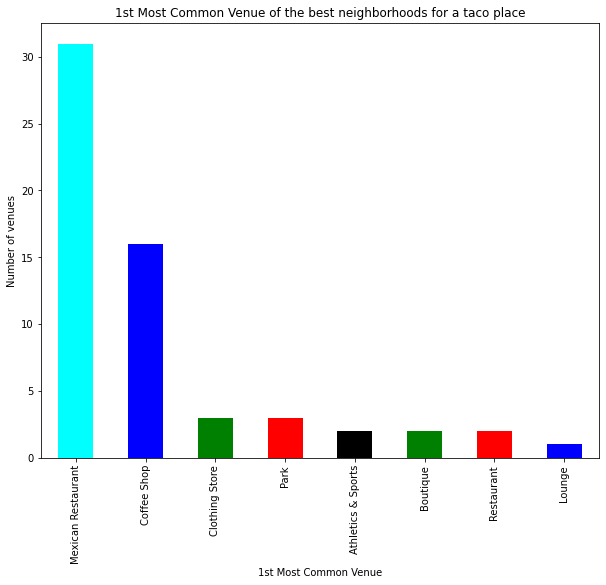

In [369]:
topbestcluster['Count'].plot(kind="bar", figsize=(10, 8), color=['cyan','blue','green','red','black', 'green', 'red', 'blue'])
plt.ylabel('Number of venues')
plt.title('1st Most Common Venue of the best neighborhoods for a taco place')
plt.show()

In [309]:
best_neighborhoods=cluster2_best.loc[:,['Neighborhood','Borough']].values.tolist()
best_neighborhoods

[['LOMAS DE CHAPULTEPEC', 'MIGUEL HIDALGO'],
 ['LOMAS DE REFORMA (LOMAS DE CHAPULTEPEC)', 'MIGUEL HIDALGO'],
 ['CHAPULTEPEC MORALES (POLANCO)', 'MIGUEL HIDALGO'],
 ['JARDINES DEL PEDREGAL', 'ALVARO OBREGON'],
 ['METROPOLITANO (U HAB)', 'ALVARO OBREGON'],
 ['LORETO', 'ALVARO OBREGON'],
 ['ANZURES', 'MIGUEL HIDALGO'],
 ['CUAUHTEMOC PENSIL', 'MIGUEL HIDALGO'],
 ['GRANADA (AMPL)', 'MIGUEL HIDALGO'],
 ['LOMAS VIRREYES (LOMAS DE CHAPULTEPEC)', 'MIGUEL HIDALGO'],
 ['PERIODISTA', 'MIGUEL HIDALGO'],
 ['PEDREGAL DE SAN ANGEL (AMPL)', 'COYOACAN'],
 ['ROMERO DE TERREROS', 'COYOACAN'],
 ['LOMAS ALTAS', 'MIGUEL HIDALGO'],
 ['TORRES TOREO', 'MIGUEL HIDALGO'],
 ['CONCIENCIA PROLETARIA', 'ALVARO OBREGON'],
 ['FRANCISCO I MADERO', 'MIGUEL HIDALGO'],
 ['LOMAS DE BARRILACO (LOMAS DE CHAPULTEPEC)', 'MIGUEL HIDALGO'],
 ['MORALES SECCION PALMAS (POLANCO)', 'MIGUEL HIDALGO'],
 ['RINCON DEL BOSQUE', 'MIGUEL HIDALGO'],
 ['ROMERO DE TERREROS (COND)', 'COYOACAN'],
 ['LOMA HERMOSA (CONJ HAB)', 'MIGUEL HIDALGO'],
 

In [314]:
cluster2_best2=cluster2.loc[(cluster2['1st Most Common Venue']!= 'Taco Place') & (cluster2['2nd Most Common Venue']!= 'Taco Place')
                                 &(cluster2['3rd Most Common Venue']!= 'Taco Place')&(cluster2['4th Most Common Venue']!= 'Taco Place')
                           &((cluster2['1st Most Common Venue']== 'Mexican Restaurant')|(cluster2['2nd Most Common Venue']== 'Mexican Restaurant'))]
cluster2_best2.reset_index(drop=True, inplace=True)
cluster2_best2.head()

,Neighborhood,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,METROPOLITANO (U HAB),ALVARO OBREGON,19.3604002285,-99.2183068464,1,Mexican Restaurant,Soccer Field,Dog Run,Athletics & Sports,Nature Preserve,Food Truck,Food,Street Art,Coffee Shop,Shopping Mall
1,LORETO,ALVARO OBREGON,19.340780261,-99.1925813836,1,Restaurant,Mexican Restaurant,Gym / Fitness Center,History Museum,Taco Place,Plaza,Breakfast Spot,Bar,Spanish Restaurant,Shopping Mall
2,CUAUHTEMOC PENSIL,MIGUEL HIDALGO,19.4449704818,-99.1938426301,1,Mexican Restaurant,Breakfast Spot,Café,Bakery,Restaurant,Convenience Store,Burger Joint,Pizza Place,Taco Place,Food Truck
3,PERIODISTA,MIGUEL HIDALGO,19.4486064484,-99.2187181385,1,Mexican Restaurant,Clothing Store,Cosmetics Shop,Sporting Goods Shop,Food Truck,Gym / Fitness Center,Food Court,Coffee Shop,Italian Restaurant,Japanese Restaurant
4,CONCIENCIA PROLETARIA,ALVARO OBREGON,19.3614401153,-99.2177304035,1,Dog Run,Mexican Restaurant,Soccer Field,Gym Pool,Pet Store,Nature Preserve,Food Truck,Shopping Mall,Park,Coffee Shop


In [313]:
cluster2_bestloc2=cluster2_best2.groupby(['Borough'],as_index=False).count()
cluster2_bestloc2.drop(['Latitude','Longitude','Neighborhood','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue',
                  '4th Most Common Venue','5th Most Common Venue','6th Most Common Venue','7th Most Common Venue',
                  '8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'], axis=1, inplace=True)
#CDMX_tacos2.dropna(subset=["Venue Category"], axis=0, inplace=True)
cluster2_bestloc2.rename(columns={'Cluster Labels':'Count'}, inplace=True)
cluster2_bestloc2=cluster2_bestloc2.sort_values('Count', ascending=False)
cluster2_bestloc2.reset_index(drop=True, inplace=True)
cluster2_bestloc2

,Borough,Count
0,ALVARO OBREGON,12
1,COYOACAN,12
2,MIGUEL HIDALGO,12
3,IZTACALCO,1


In [315]:
best_neighborhoods2=cluster2_best2.loc[:,['Neighborhood','Borough']].values.tolist()
best_neighborhoods2

[['METROPOLITANO (U HAB)', 'ALVARO OBREGON'],
 ['LORETO', 'ALVARO OBREGON'],
 ['CUAUHTEMOC PENSIL', 'MIGUEL HIDALGO'],
 ['PERIODISTA', 'MIGUEL HIDALGO'],
 ['CONCIENCIA PROLETARIA', 'ALVARO OBREGON'],
 ['FRANCISCO I MADERO', 'MIGUEL HIDALGO'],
 ['LOMAS DE BARRILACO (LOMAS DE CHAPULTEPEC)', 'MIGUEL HIDALGO'],
 ['LOMA HERMOSA (CONJ HAB)', 'MIGUEL HIDALGO'],
 ['CANTIL DEL PEDREGAL', 'COYOACAN'],
 ['LA CONCEPCION (BARR)', 'COYOACAN'],
 ['VILLA PANAMERICANA 3ERA. SECCIN (U HAB)', 'COYOACAN'],
 ['IRRIGACION', 'MIGUEL HIDALGO'],
 ['COPILCO UNIVERSIDAD', 'COYOACAN'],
 ['MORALES SECCION ALAMEDA (POLANCO)', 'MIGUEL HIDALGO'],
 ['CUADRANTE DE SAN FRANCISCO', 'COYOACAN'],
 ['FLORIDA', 'ALVARO OBREGON'],
 ['SAN GABRIEL', 'ALVARO OBREGON'],
 ['CHAPULTEPEC POLANCO (POLANCO)', 'MIGUEL HIDALGO'],
 ['LOS MORALES (POLANCO)', 'MIGUEL HIDALGO'],
 ['SAN DIEGO OCOYOACAC', 'MIGUEL HIDALGO'],
 ['HACIENDAS DE COYOACAN (FRACC)', 'COYOACAN'],
 ['GUADALUPE INN', 'ALVARO OBREGON'],
 ['OXTOPULCO UNIVERSIDAD', 'COYOAC

In [374]:
map_bestneighborhoods = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster2_best['Latitude'], cluster2_best['Longitude'], cluster2_best['Borough'], cluster2_best['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='purple',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bestneighborhoods)  
    
map_bestneighborhoods

In [372]:
map_bestneighborhoods2 = folium.Map(location=[lat_cdmx, lon_cdmx], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(cluster2_best2['Latitude'], cluster2_best2['Longitude'], cluster2_best2['Borough'], cluster2_best2['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='purple',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bestneighborhoods2)  
    
map_bestneighborhoods2